In [24]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
#Function takes a pandas DataFrame as a parameter and returns a float value representing the screen space used by the parallel coordinates visualization of that DataFrame.
def screen_space(df):
    n = len(df.columns)
    d = np.max(df.max()) - np.min(df.min())
    return n * np.log10(d)

def distortion(df):
   #Function takes a pandas DataFrame as a parameter and returns a float value representing the distortion introduced by the parallel coordinates visualization of that DataFrame.
    x_min = np.min(df.min())
    x_max = np.max(df.max())
    y_min = 0
    y_max = 1
    s = (y_max - y_min) / (x_max - x_min)
    p = np.abs(np.diff(df.values, axis=1)).sum()
    return p * s

def quality(df):
 #Function takes a pandas DataFrame as a parameter and returns a float value representing the visual quality of the parallel coordinates visualization of that DataFrame.
    return 1 / (screen_space(df) * distortion(df))

# Example usage:
df = pd.read_csv("P:/Spring 23/IV/diabetes.csv")
# Create a dataframe from the iris data
print('Screen space:', screen_space(df))
print('Distortion:', distortion(df))
print('Quality:', quality(df))
len(df)

Screen space: 26.346333267351213
Distortion: 422.46327423167844
Quality: 8.984436804121295e-05


768

In [25]:
diabetes_df=df

In [26]:
#calculates the length of the pandas DataFrame 'df'
length=len(df)

In [27]:
#creates five samples of the DataFrame 'df' with different sampling sizes.
sample_df_1 = df.sample(n=int(0.1*length), random_state=2)
sample_df_2 = df.sample(n=int(0.25*length), random_state=2)
sample_df_3 = df.sample(n=int(0.5*length), random_state=2)
sample_df_4 = df.sample(n=int(0.75*length), random_state=2)
sample_df_5 = df.sample(n=int(0.9*length), random_state=2)


In [28]:
#Printing visual quality of each sample
print('Quality 1:', quality(sample_df_1))
print('Quality 2:', quality(sample_df_2))
print('Quality 3:', quality(sample_df_3))
print('Quality 4:', quality(sample_df_4))
print('Quality 5:', quality(sample_df_5))

Quality 1: 0.0004764493936569731
Quality 2: 0.0002397886054385724
Quality 3: 0.0001886969169699083
Quality 4: 0.00012142191159820648
Quality 5: 0.00010047946869159715


0.18857064199749562
0.37468155701930855
0.4761305562588525
0.7399353778790289
0.8941564800364674


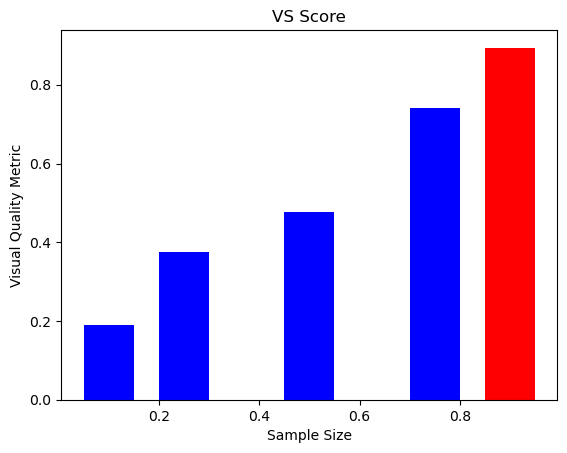

In [29]:
import matplotlib.pyplot as plt
# Create an empty list called 'qual' to store the calculated qualities.
qual=[]
# Create a list for containing the five different sample sizes as decimal values.
sample_size=[0.1,0.25,0.5,0.75,0.9]

# Calculate the quality ratio for each of the five samples by dividing the quality of the original dataset by the quality of each sample.
qual.append(quality(df)/quality(sample_df_1))
qual.append(quality(df)/quality(sample_df_2))
qual.append(quality(df)/quality(sample_df_3))
qual.append(quality(df)/quality(sample_df_4))
qual.append(quality(df)/quality(sample_df_5))

# Print the quality ratio for each of the five samples.
print(quality(df)/quality(sample_df_1))
print(quality(df)/quality(sample_df_2))
print(quality(df)/quality(sample_df_3))
print(quality(df)/quality(sample_df_4))
print(quality(df)/quality(sample_df_5))

colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qual[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar(sample_size,qual,width=0.1,color=colors)

# Add labels and title
plt.xlabel("Sample Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

In [30]:
diabetes=df
diabetes

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [31]:
# Define the target population
target_population = diabetes[diabetes['Outcome'] == 1]

# Determine the sample size
sample_size = 0.25*length

# Choose a sampling method (random sampling)
target_population = diabetes[diabetes['Outcome'] == 1]

# Determine the sample size
sample_size = 100

# Choose a sampling method (e.g., stratified random sampling)
sample = target_population.sample(n=sample_size, replace=True, random_state=42)

# View the sample data
print(sample.head())

     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
269            2      146              0              0        0  27.5   
283            7      161             86              0        0  30.4   
195            5      158             84             41      210  39.4   
535            4      132              0              0        0  32.9   
38             2       90             68             42        0  38.2   

     DiabetesPedigreeFunction  Age  Outcome  
269                     0.240   28        1  
283                     0.165   47        1  
195                     0.395   29        1  
535                     0.302   23        1  
38                      0.503   27        1  


In [32]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
diabetes_df=df
# Define the target variable and the stratification variable
target = 'Outcome'
stratify_by = 'Outcome'

split = StratifiedShuffleSplit(n_splits=1, test_size=0.9, random_state=42)

# Perform the stratified sampling
for train_index, test_index in split.split(diabetes_df, diabetes_df[stratify_by]):
    strat_df_1 = diabetes_df.loc[train_index]
    strat_df_test = diabetes_df.loc[test_index]

# Print the stratified training set
print(strat_df_1)


     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
726            1      116             78             29      180  36.1   
624            2      108             64              0        0  30.8   
84             5      137            108              0        0  48.8   
594            6      123             72             45      230  33.6   
197            3      107             62             13       48  22.9   
..           ...      ...            ...            ...      ...   ...   
251            2      129             84              0        0  28.0   
60             2       84              0              0        0   0.0   
757            0      123             72              0        0  36.3   
556            1       97             70             40        0  38.1   
291            0      107             62             30       74  36.6   

     DiabetesPedigreeFunction  Age  Outcome  
726                     0.496   25        0  
624                

In [33]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit

# Defining the target variable and the stratification variable
target = 'Outcome'
stratify_by = 'Outcome'

split = StratifiedShuffleSplit(n_splits=1, test_size=0.75, random_state=42)

# Performing the stratified sampling
for train_index, test_index in split.split(diabetes_df, diabetes_df[stratify_by]):
    strat_df_2 = diabetes_df.loc[train_index]
    strat_df_test = diabetes_df.loc[test_index]

# Print the stratified training set
print(strat_df_2)


     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
254           12       92             62              7      258  27.6   
631            0      102             78             40       90  34.5   
695            7      142             90             24      480  30.4   
289            5      108             72             43       75  36.1   
101            1      151             60              0        0  26.1   
..           ...      ...            ...            ...      ...   ...   
693            7      129             68             49      125  38.5   
113            4       76             62              0        0  34.0   
556            1       97             70             40        0  38.1   
210            2       81             60             22        0  27.7   
107            4      144             58             28      140  29.5   

     DiabetesPedigreeFunction  Age  Outcome  
254                     0.926   44        1  
631                

In [34]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit

# Defining the target variable and the stratification variable
target = 'Outcome'
stratify_by = 'Outcome'

split = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)

# Performing the stratified sampling
for train_index, test_index in split.split(diabetes_df, diabetes_df[stratify_by]):
    strat_df_3 = diabetes_df.loc[train_index]
    strat_df_test = diabetes_df.loc[test_index]

# Print the stratified training set
print(strat_df_3)


     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
621            2       92             76             20        0  24.2   
197            3      107             62             13       48  22.9   
2              8      183             64              0        0  23.3   
611            3      174             58             22      194  32.9   
171            6      134             70             23      130  35.4   
..           ...      ...            ...            ...      ...   ...   
747            1       81             74             41       57  46.3   
113            4       76             62              0        0  34.0   
556            1       97             70             40        0  38.1   
328            2      102             86             36      120  45.5   
107            4      144             58             28      140  29.5   

     DiabetesPedigreeFunction  Age  Outcome  
621                     1.698   28        0  
197                

In [35]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit

# Defining the target variable and the stratification variable
target = 'Outcome'
stratify_by = 'Outcome'

split = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)

# Performing the stratified sampling
for train_index, test_index in split.split(diabetes_df, diabetes_df[stratify_by]):
    strat_df_4 = diabetes_df.loc[train_index]
    strat_df_test = diabetes_df.loc[test_index]

# Printing the stratified training set
print(strat_df_4)


     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
751            1      121             78             39       74  39.0   
358           12       88             74             40       54  35.3   
718            1      108             60             46      178  35.5   
536            0      105             90              0        0  29.6   
651            1      117             60             23      106  33.8   
..           ...      ...            ...            ...      ...   ...   
676            9      156             86              0        0  24.8   
113            4       76             62              0        0  34.0   
556            1       97             70             40        0  38.1   
152            9      156             86             28      155  34.3   
107            4      144             58             28      140  29.5   

     DiabetesPedigreeFunction  Age  Outcome  
751                     0.261   28        0  
358                

In [36]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit

# Defining the target variable and the stratification variable
target = 'Outcome'
stratify_by = 'Outcome'

split = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)

# Performing the stratified sampling
for train_index, test_index in split.split(diabetes_df, diabetes_df[stratify_by]):
    strat_df_5 = diabetes_df.loc[train_index]
    strat_df_test = diabetes_df.loc[test_index]

# Printing the stratified training set
print(strat_df_5)


     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
255            1      113             64             35        0  33.6   
125            1       88             30             42       99  55.0   
46             1      146             56              0        0  29.7   
312            2      155             74             17       96  26.6   
519            6      129             90              7      326  19.6   
..           ...      ...            ...            ...      ...   ...   
215           12      151             70             40      271  41.8   
113            4       76             62              0        0  34.0   
556            1       97             70             40        0  38.1   
448            0      104             64             37       64  33.6   
107            4      144             58             28      140  29.5   

     DiabetesPedigreeFunction  Age  Outcome  
255                     0.543   21        1  
125                

In [37]:
##Printing visual quality of each stratified training set
print('Quality:', quality(strat_df_1))
print('Quality:', quality(strat_df_2))
print('Quality:', quality(strat_df_3))
print('Quality:', quality(strat_df_4))
print('Quality:', quality(strat_df_5))


Quality: 0.0006219425564390093
Quality: 0.0002678583585152689
Quality: 0.00016580786399515902
Quality: 0.00010853838643839505
Quality: 0.00010018486769129685


0.1444576627070277
0.33541745174284526
0.5418583044036805
0.8277658346451228
0.8967858131834195


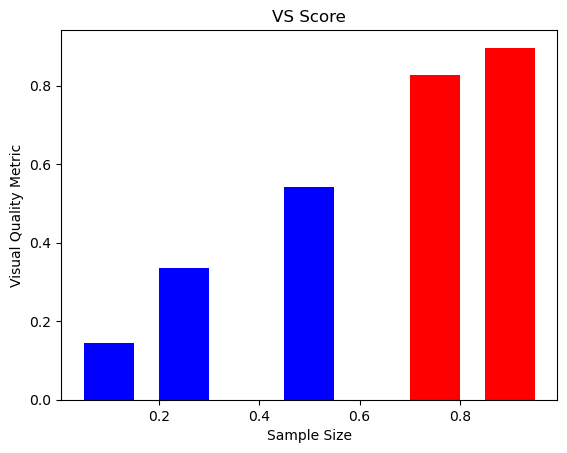

In [38]:
# Creating an empty list to store the VS scores
qual2=[]
# Defining the sample sizes
sample_size2=[0.1,0.25,0.5,0.75,0.9]
#Calculating the VS score for each sample and append it to the qual2 list
qual2.append(quality(df)/quality(strat_df_1))
qual2.append(quality(df)/quality(strat_df_2))
qual2.append(quality(df)/quality(strat_df_3))
qual2.append(quality(df)/quality(strat_df_4))
qual2.append(quality(df)/quality(strat_df_5))
# Printing the VS scores
print(quality(df)/quality(strat_df_1))
print(quality(df)/quality(strat_df_2))
print(quality(df)/quality(strat_df_3))
print(quality(df)/quality(strat_df_4))
print(quality(df)/quality(strat_df_5))

# Add labels and title
plt.xlabel("Sample Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")
# Assigning colors to the bars based on the VS score
colors=[0]*5
for t in range(5):
    if qual2[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
# Create a bar chart with the sample sizes on the x-axis and the VS scores on the y-axis
plt.bar(sample_size2,qual2,width=0.1,color=colors)
# Display the chart
plt.show()

In [15]:
import matplotlib.pyplot as plt
from bokeh.plotting import figure, show
from bokeh.models import HoverTool
import mplcursors

# Creating a new figure object
p = figure(title='My Plot')

# Adding circle glyphs to the figure with a hover tooltip
circle = p.circle(sample_size,qual, size=10, fill_color='blue', alpha=0.5, hover_fill_color='red', hover_alpha=1.0, line_color=None, hover_line_color='white')
hover = HoverTool(tooltips=[('x', '@x'), ('y', '@y')], renderers=[circle])
p.add_tools(hover)

# Display the plot
show(p)

In [16]:
import matplotlib.pyplot as plt
from bokeh.plotting import figure, show
from bokeh.models import HoverTool
import mplcursors

# creating a figure with a title
p = figure(title='My Plot')

# Adding circle glyphs to the figure with a hover tooltip
circle = p.circle(sample_size,qual2, size=10, fill_color='blue', alpha=0.5, hover_fill_color='red', hover_alpha=1.0, line_color=None, hover_line_color='white')
hover = HoverTool(tooltips=[('x', '@x'), ('y', '@y')], renderers=[circle])
p.add_tools(hover)

# Display the plot
show(p)

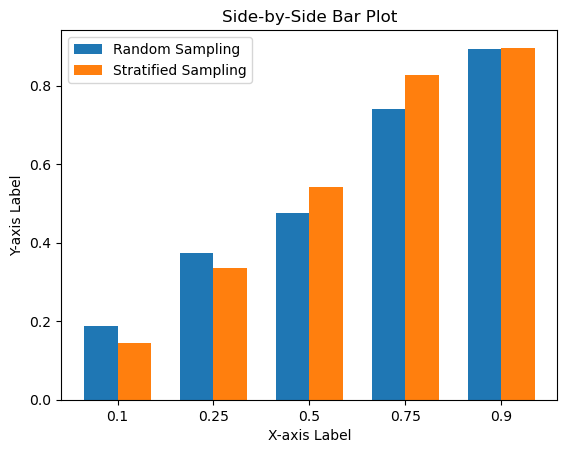

In [39]:
# Set the width of the bars
bar_width = 0.35

# Set the positions of the bars on the X-axis
x_pos1 = np.arange(len(qual))
x_pos2 = [x + bar_width for x in x_pos1]

# Create the plot
fig, ax = plt.subplots()
ax.bar(x_pos1, qual, width=bar_width, label='Random Sampling')
ax.bar(x_pos2, qual2, width=bar_width, label='Stratified Sampling')

# Add labels and titles to the plot
ax.set_xlabel('X-axis Label')
ax.set_ylabel('Y-axis Label')
ax.set_title('Side-by-Side Bar Plot')
ax.set_xticks([x + bar_width / 2 for x in x_pos1])
ax.set_xticklabels([0.1,0.25,0.5,0.75,0.9])

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()


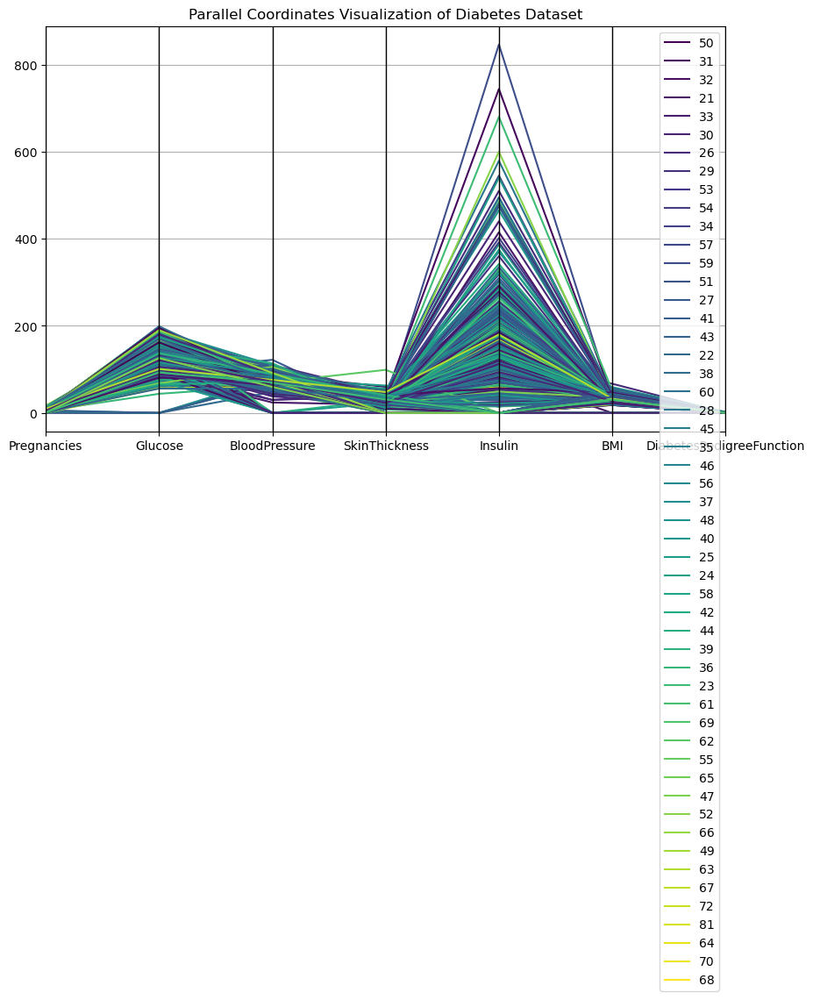

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Selecting only the relevant columns for the visualization

df = df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]

# Creating the parallel coordinates visualization using pandas and matplotlib
plt.figure(figsize=(10,6))
parallel_coordinates(df, 'Age', colormap='viridis')

# Adding a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Displaying the plot
plt.show()

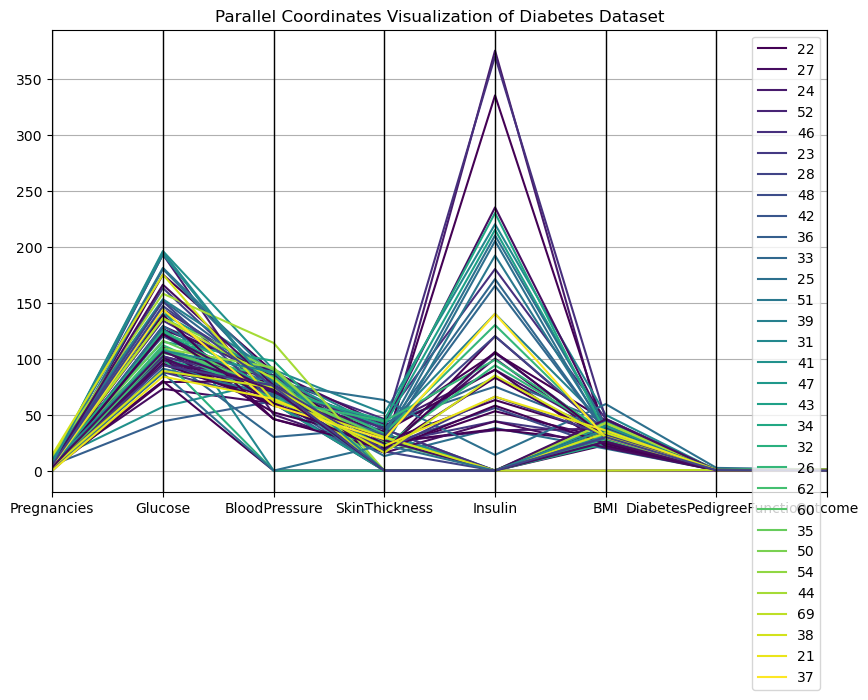

In [41]:
# Creating a parallel coordinates visualization using the first sample dataframe and Age as the color parameter

plt.figure(figsize=(10,6))

#Generating a parallel coordinates plot of sample_df_1 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(sample_df_1, 'Age', colormap='viridis')

# Adding a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Displaying the plot
plt.show()

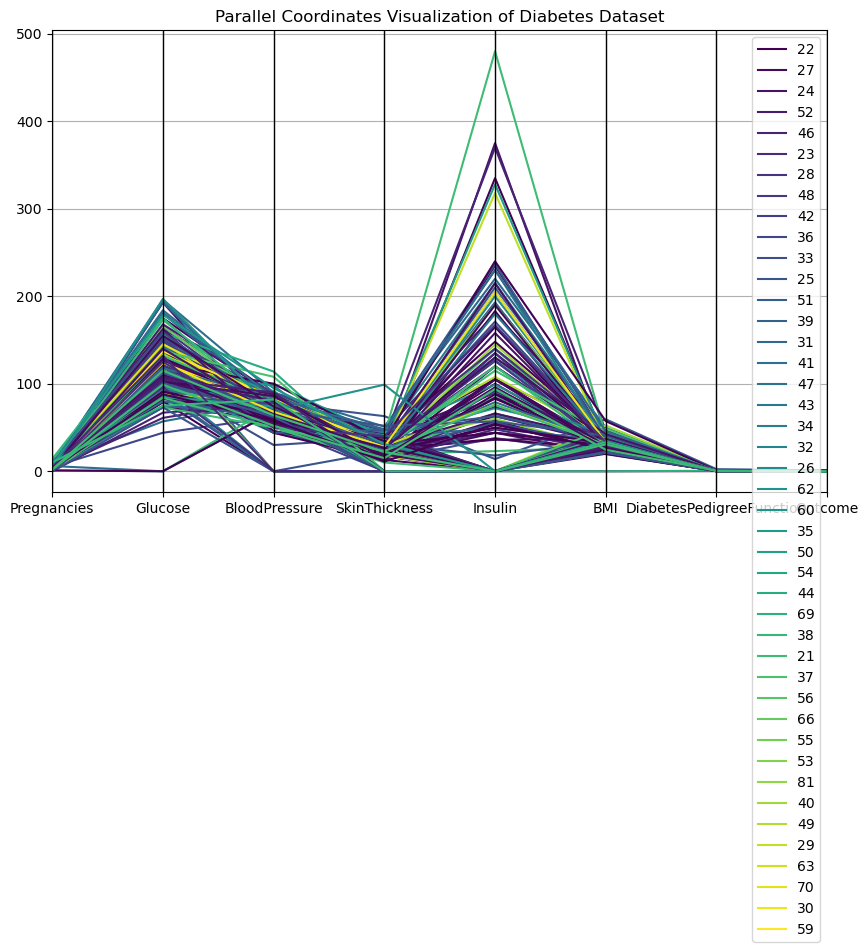

In [42]:

# Creating parallel coordinates plot for sample_df_2

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of sample_df_2 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(sample_df_2, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

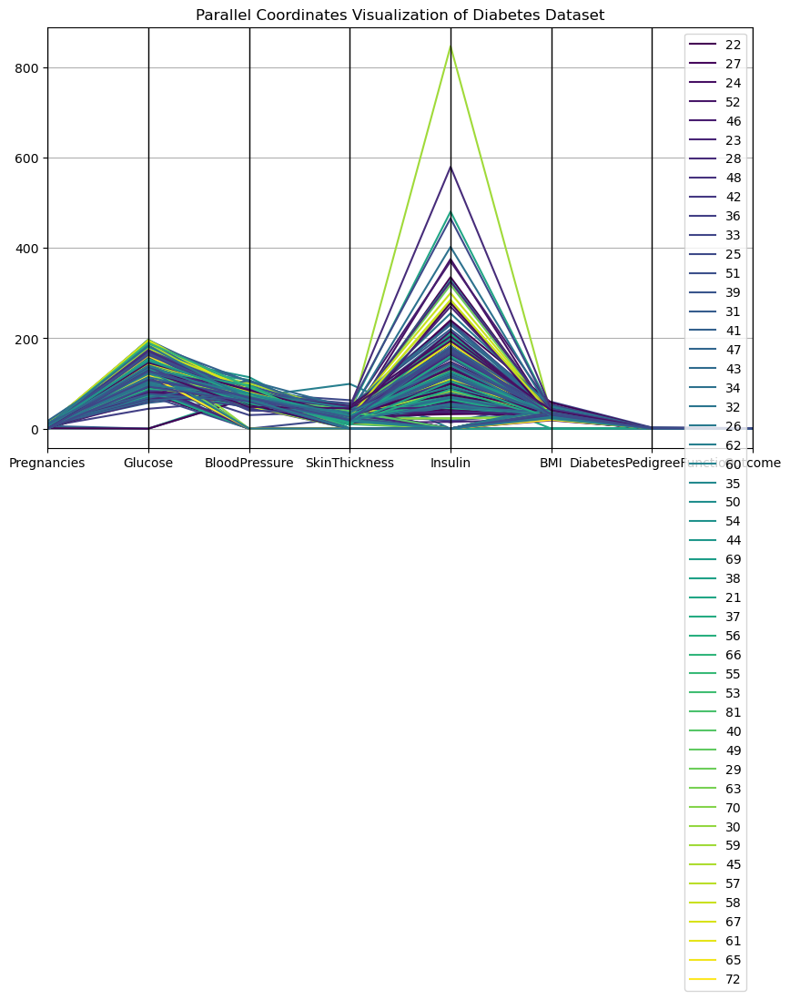

In [43]:
# Creating the parallel coordinates visualization using pandas and matplotlib

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of sample_df_3 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(sample_df_3, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

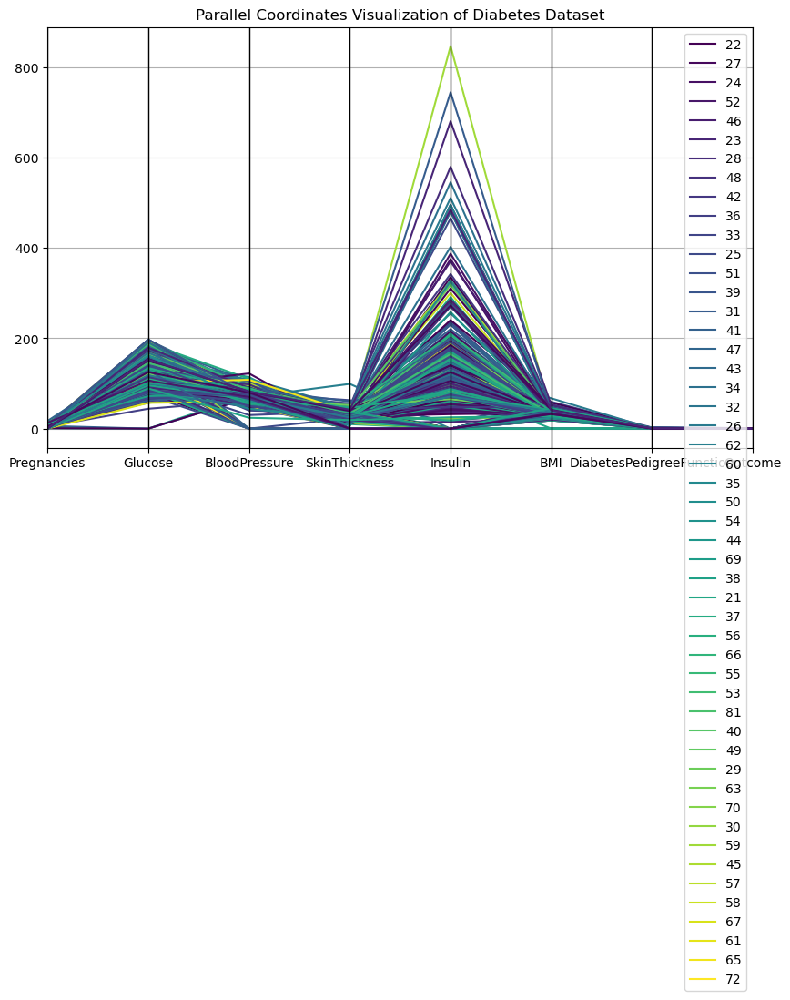

In [44]:
#Creating a figure with a size of 10x6

plt.figure(figsize=(10,6))

#Generating a parallel coordinates plot of sample_df_4 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(sample_df_4, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

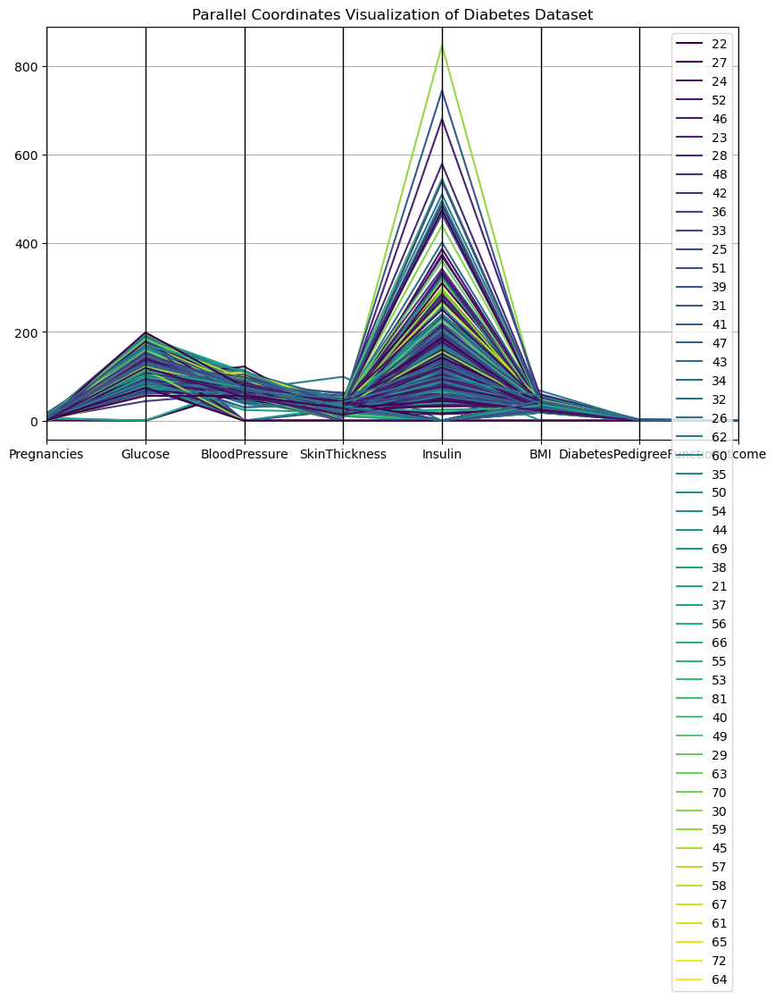

In [45]:
#Creating a figure with a size of 10x6

plt.figure(figsize=(10,6))

#Generating a parallel coordinates plot of sample_df_5 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(sample_df_5, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

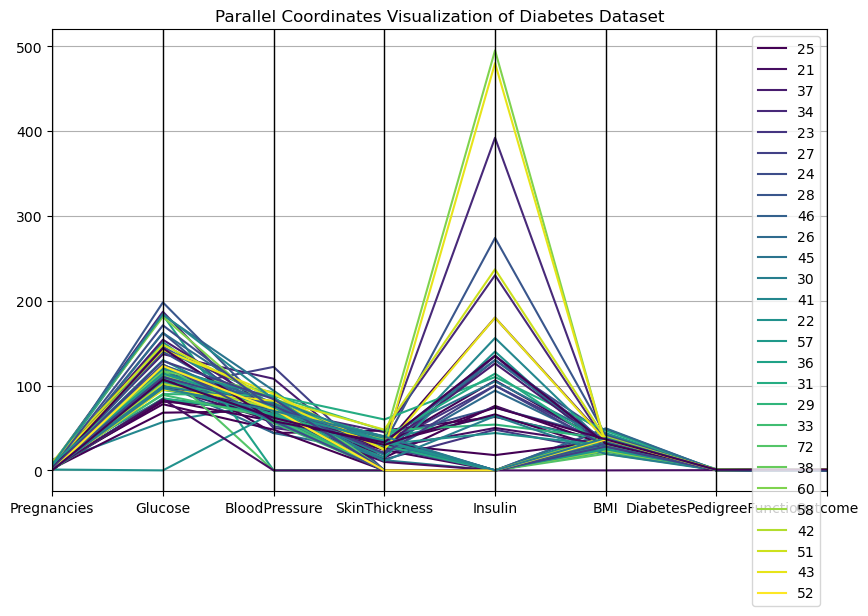

In [46]:
#Creating a figure with a size of 10x6

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of strat_df_1 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(strat_df_1, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

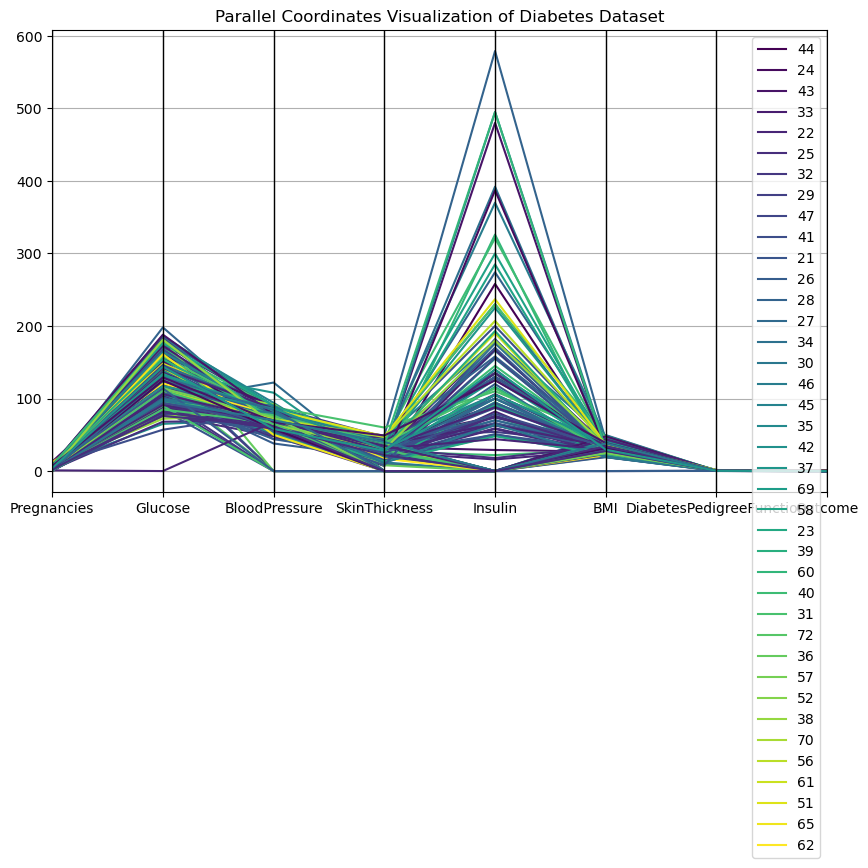

In [47]:
#Creating a figure with a size of 10x6

plt.figure(figsize=(10,6))

#Generating a parallel coordinates plot of strat_df_2 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(strat_df_2, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

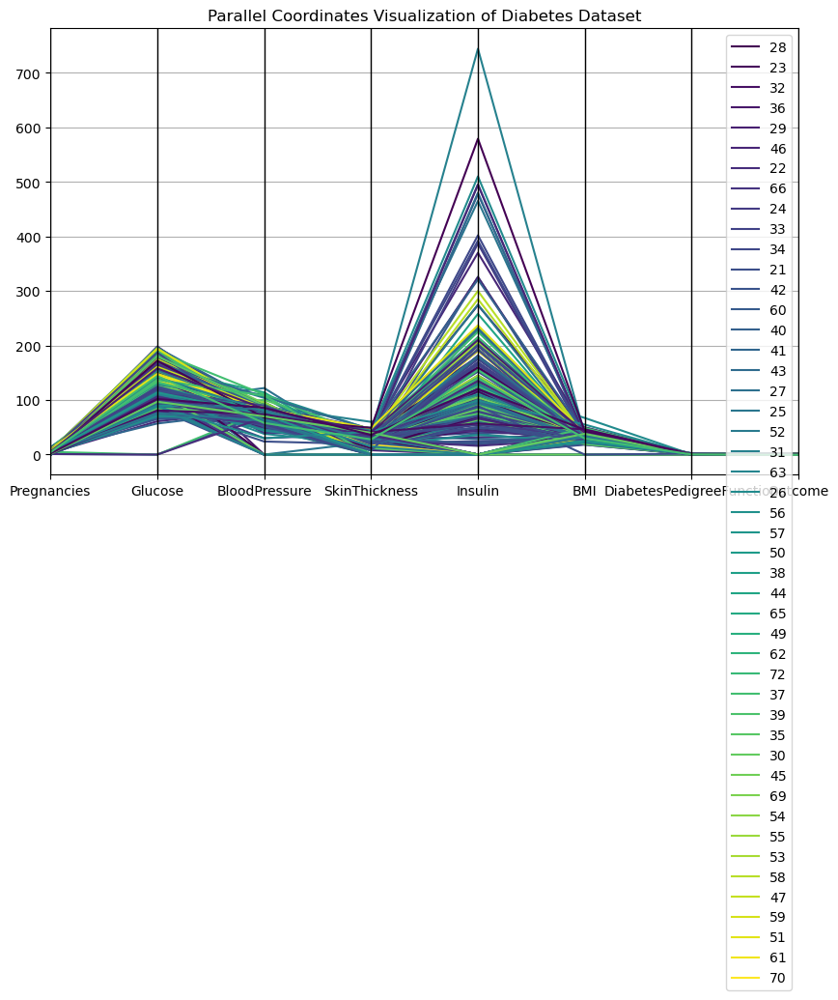

In [48]:
#Creating a figure with a size of 10x6

plt.figure(figsize=(10,6))

#Generating a parallel coordinates plot of strat_df_3 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(strat_df_3, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

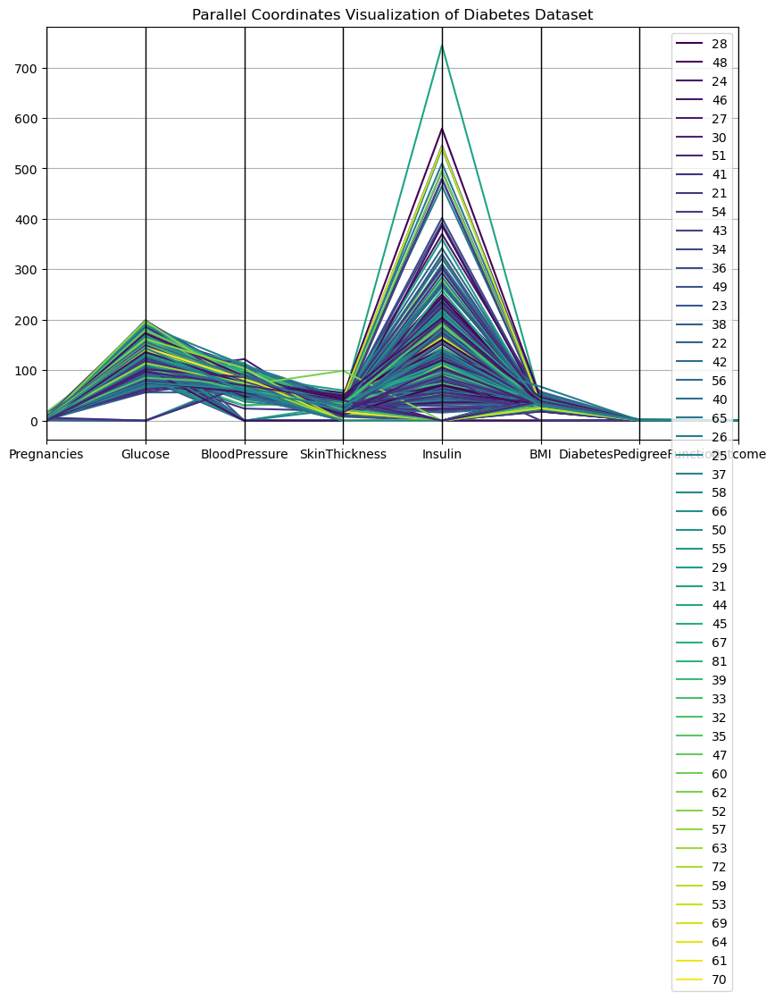

In [49]:
#Creating a figure with a size of 10x6

plt.figure(figsize=(10,6))

#Generating a parallel coordinates plot of strat_df_4 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(strat_df_4, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

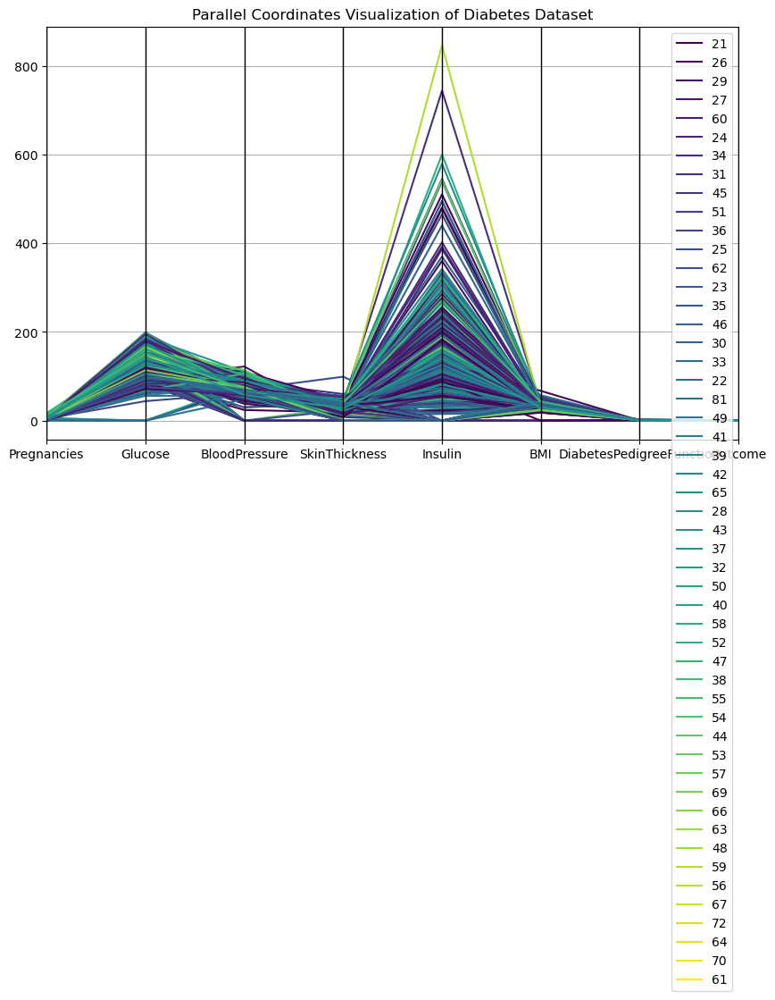

In [50]:
#Creating a figure with a size of 10x6

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of strat_df_5 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(strat_df_5, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

In [51]:
step_size = 10

# Generate the sample
samp_df_1 = diabetes_df.iloc[::step_size]


In [52]:
step_size = 8

# Generate the sample
samp_df_2 = diabetes_df.iloc[::step_size]


In [53]:
step_size = 5

# Generate the sample
samp_df_3 = diabetes_df.iloc[::step_size]


In [54]:
step_size = 4

# Generate the sample
samp_df_4 = diabetes_df.iloc[::step_size]


In [55]:
step_size = 2

# Generate the sample
samp_df_5 = diabetes_df.iloc[::step_size]


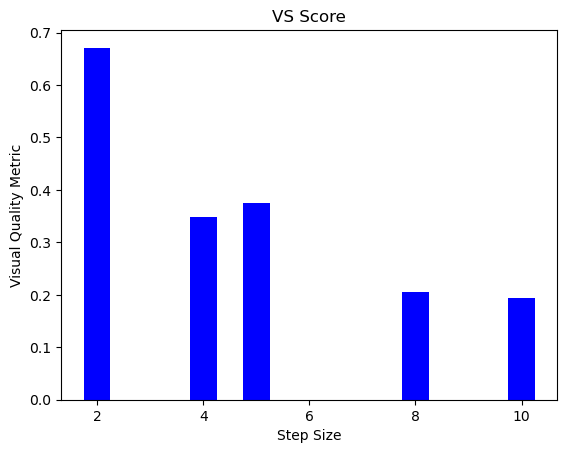

In [56]:
qual_s=[]
import matplotlib.pyplot as plt
qual_s.append(quality(df)/quality(samp_df_1))
qual_s.append(quality(df)/quality(samp_df_2))
qual_s.append(quality(df)/quality(samp_df_3))
qual_s.append(quality(df)/quality(samp_df_4))
qual_s.append(quality(df)/quality(samp_df_5))

colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qual_s[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar([10,8,5,4,2],qual_s,width=0.5,color=colors)

# Add labels and title
plt.xlabel("Step Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

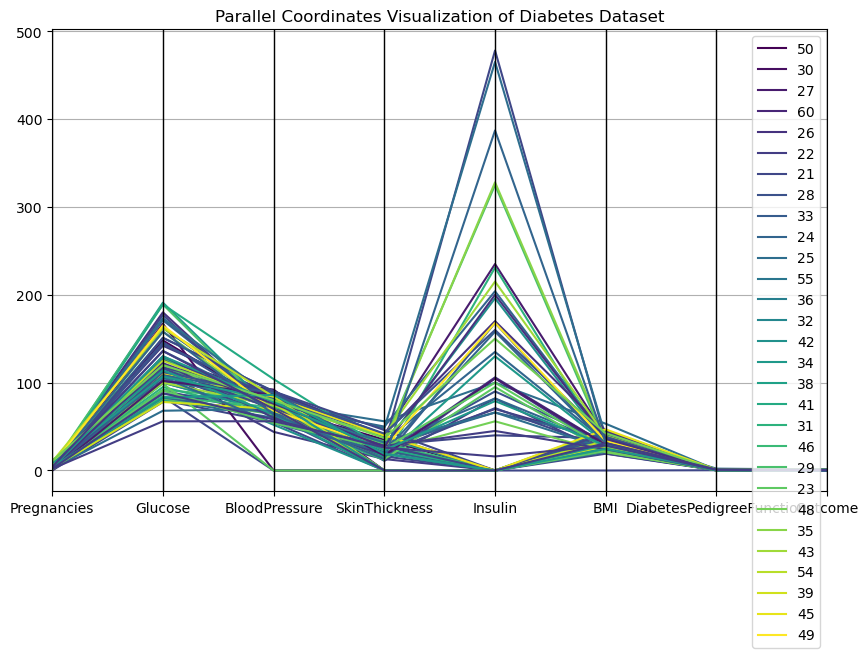

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Selecting only the relevant columns for the visualization

df = df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of strat_df_5 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(samp_df_1, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

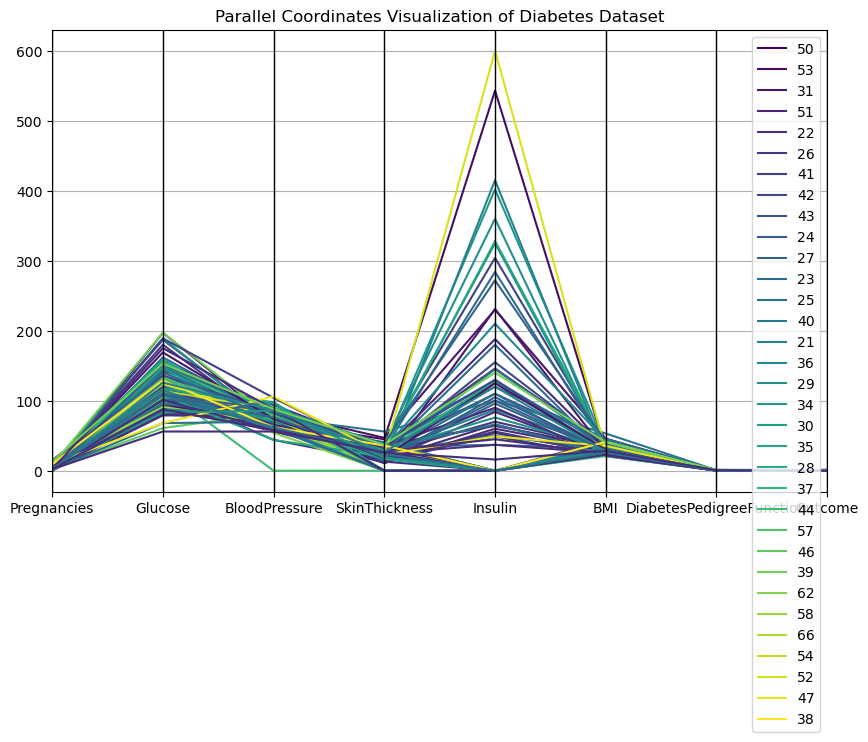

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Selecting only the relevant columns for the visualization

df = df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of strat_df_5 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(samp_df_2, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

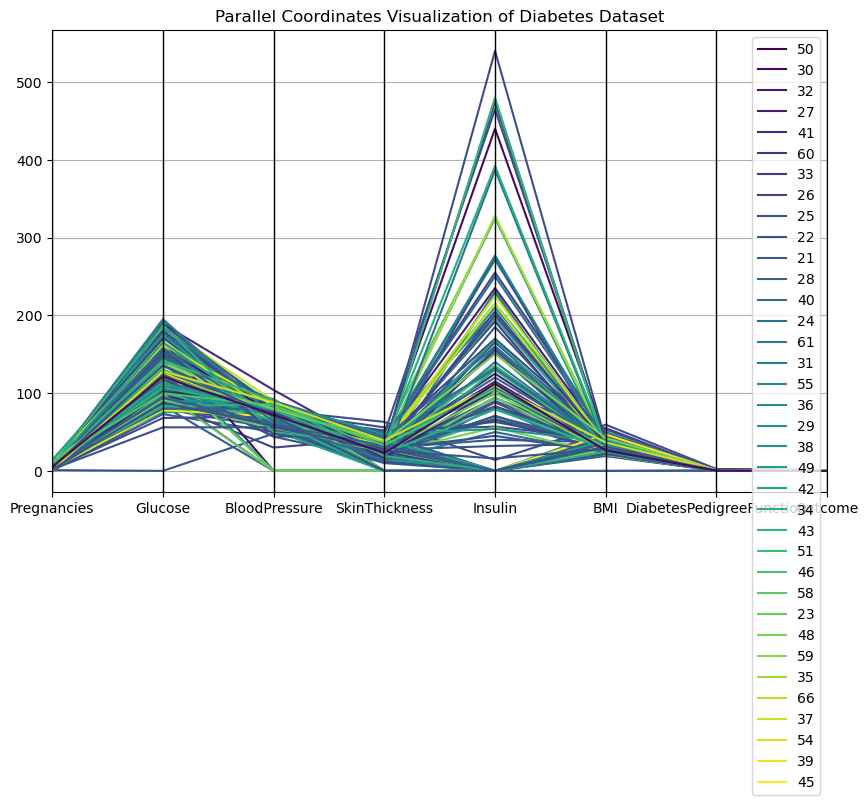

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Selecting only the relevant columns for the visualization

df = df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of strat_df_5 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(samp_df_3, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

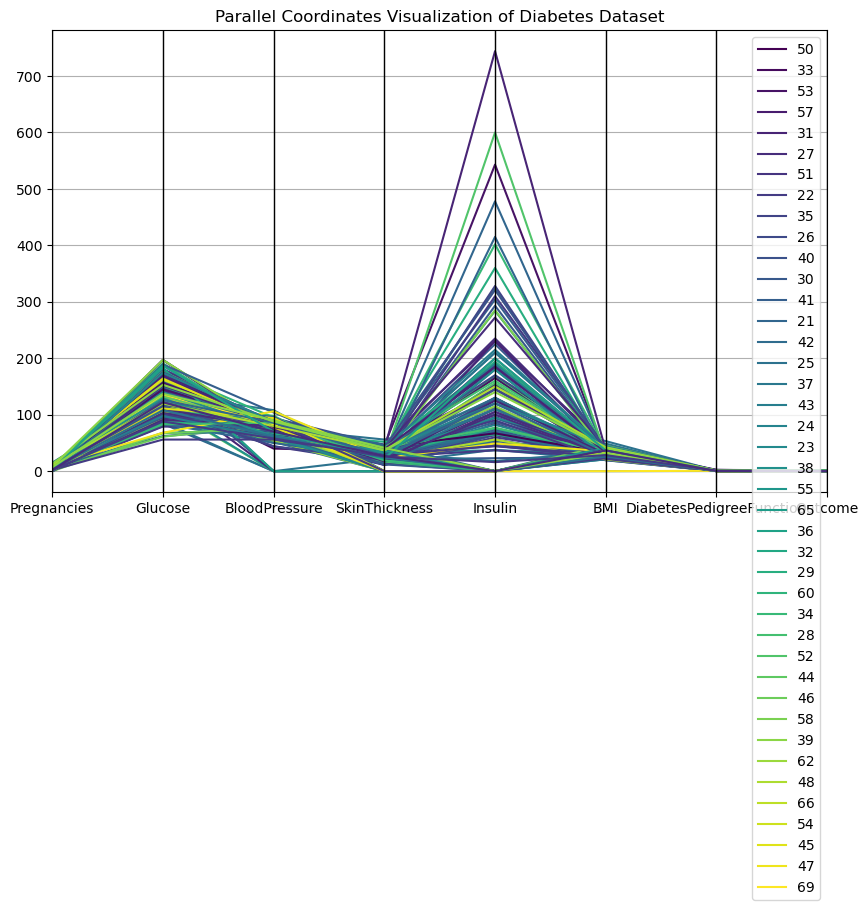

In [60]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Selecting only the relevant columns for the visualization

df = df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of strat_df_5 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(samp_df_4, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

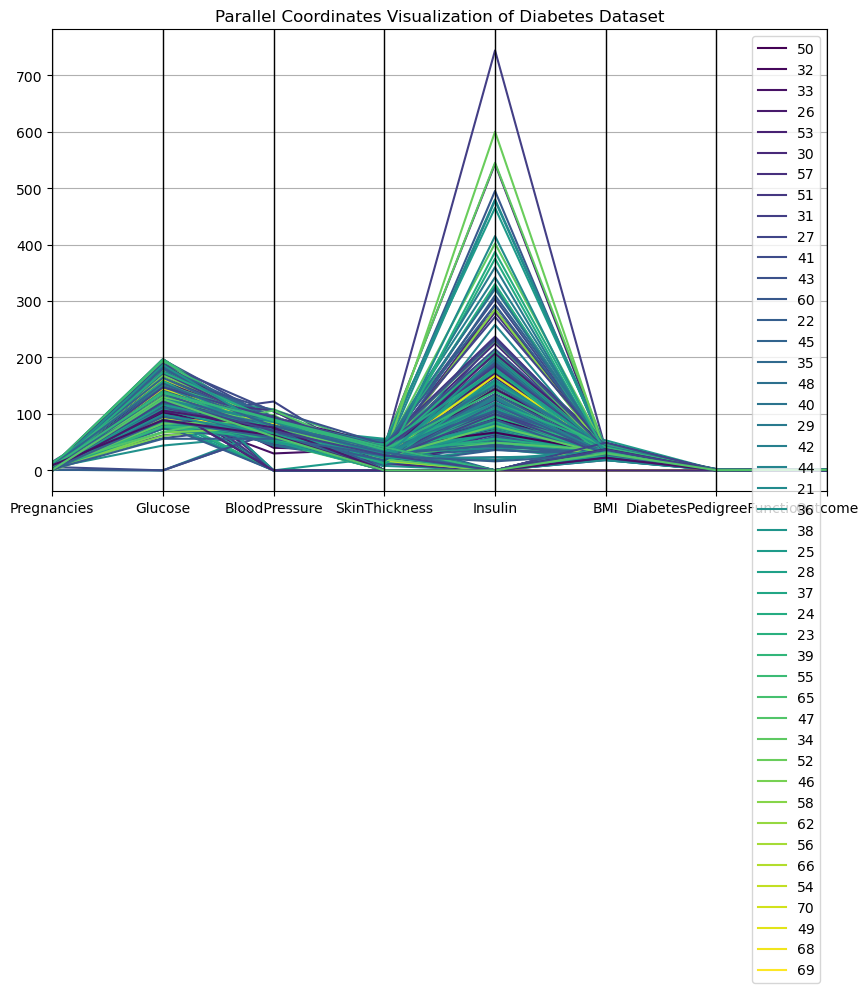

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Selecting only the relevant columns for the visualization

df = df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']]

plt.figure(figsize=(10,6))
#Generating a parallel coordinates plot of strat_df_5 DataFrame, using 'Age' as the class column, and the 'viridis' colormap
parallel_coordinates(samp_df_5, 'Age', colormap='viridis')

# Add a legend and title to the plot
plt.legend(loc='best')
plt.title('Parallel Coordinates Visualization of Diabetes Dataset')

# Display the plot
plt.show()

In [62]:
import numpy as np
import pandas as pd
def screen_space(df):
    n = len(df.columns)
    d = np.max(df.max()) - np.min(df.min())
    return n * np.log10(d)

def distortion(df):
   #Function takes a pandas DataFrame as a parameter and returns a float value representing the distortion introduced by the parallel coordinates visualization of that DataFrame.
    df = df.fillna(0)
    x_min = np.min(df.min())
    x_max = np.max(df.max())
    y_min = 0
    y_max = 1
    s = (y_max - y_min) / (x_max - x_min)
    p = np.abs(np.diff(df.values, axis=1)).sum()
    return p * s

def quality(df):
 #Function takes a pandas DataFrame as a parameter and returns a float value representing the visual quality of the parallel coordinates visualization of that DataFrame.
    return 1 / (screen_space(df) * distortion(df))

df_b = pd.read_csv("P:/Spring 23/IV/Boston/HousingData.csv")
# Create a dataframe from the iris data
print('Screen space:', screen_space(df_b))
print('Distortion:', distortion(df_b))
print('Quality:', quality(df_b))
len(df_b)

Screen space: 39.926174410216724
Distortion: 1186.4485032770747
Quality: 2.1110251512434807e-05


506

In [63]:
#calculates the length of the pandas DataFrame 'df'
length=len(df_b)
#creates five samples of the DataFrame 'df' with different sampling sizes.
sample_df_1 = df_b.sample(n=int(0.1*length), random_state=2)
sample_df_2 = df_b.sample(n=int(0.25*length), random_state=2)
sample_df_3 = df_b.sample(n=int(0.5*length), random_state=2)
sample_df_4 = df_b.sample(n=int(0.75*length), random_state=2)
sample_df_5 = df_b.sample(n=int(0.9*length), random_state=2)
#Printing visual quality of each sample
print('Quality 1:', quality(sample_df_1))
print('Quality 2:', quality(sample_df_2))
print('Quality 3:', quality(sample_df_3))
print('Quality 4:', quality(sample_df_4))
print('Quality 5:', quality(sample_df_5))

Quality 1: 0.00019431058470326497
Quality 2: 8.375971591247559e-05
Quality 3: 4.1868872855299994e-05
Quality 4: 2.8014407314170663e-05
Quality 5: 2.332031693488681e-05


0.10864179913138872
0.25203346599806864
0.5041991836129057
0.7535498172669356
0.9052300434585526


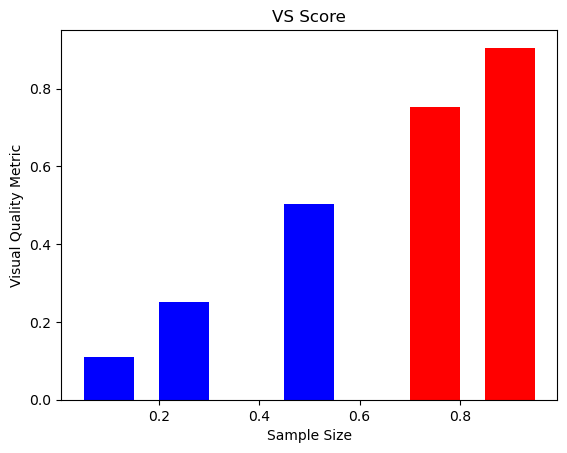

In [64]:
import matplotlib.pyplot as plt
# Create an empty list called 'qual' to store the calculated qualities.
qual=[]
# Create a list for containing the five different sample sizes as decimal values.
sample_size=[0.1,0.25,0.5,0.75,0.9]

# Calculate the quality ratio for each of the five samples by dividing the quality of the original dataset by the quality of each sample.
qual.append(quality(df_b)/quality(sample_df_1))
qual.append(quality(df_b)/quality(sample_df_2))
qual.append(quality(df_b)/quality(sample_df_3))
qual.append(quality(df_b)/quality(sample_df_4))
qual.append(quality(df_b)/quality(sample_df_5))

# Print the quality ratio for each of the five samples.
print(quality(df_b)/quality(sample_df_1))
print(quality(df_b)/quality(sample_df_2))
print(quality(df_b)/quality(sample_df_3))
print(quality(df_b)/quality(sample_df_4))
print(quality(df_b)/quality(sample_df_5))

colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qual[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar(sample_size,qual,width=0.1,color=colors)

# Add labels and title
plt.xlabel("Sample Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

In [65]:
df_b.fillna(0)
df_sorted = df_b.sort_values(by='RAD')
df_sorted.fillna(0)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0
254,0.04819,80.0,3.64,0.0,0.392,6.108,32.0,9.2203,1,315,16.4,392.89,6.57,21.9
255,0.03548,80.0,3.64,0.0,0.392,5.876,19.1,9.2203,1,315,16.4,395.18,9.25,20.9
283,0.01501,90.0,1.21,1.0,0.401,7.923,24.8,5.8850,1,198,13.6,395.52,3.16,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406,20.71620,0.0,0.00,0.0,0.659,4.138,100.0,1.1781,24,666,20.2,370.22,23.34,11.9
407,11.95110,0.0,18.10,0.0,0.659,5.608,100.0,1.2852,24,666,20.2,332.09,0.00,27.9
408,7.40389,0.0,18.10,0.0,0.597,5.617,97.9,1.4547,24,666,20.2,314.64,26.40,17.2
410,51.13580,0.0,18.10,0.0,0.597,5.757,100.0,1.4130,24,666,20.2,2.60,10.11,15.0


Quality 1: 0.00017733229838606723
Quality 2: 8.97695201436439e-05
Quality 3: 3.54901495538895e-05
Quality 4: 2.365949930250973e-05
Quality 5: 2.013545578800913e-05
[0.11904346644442641, 0.23516056985328013, 0.5948200212675986, 0.8922526737577872, 1.0484119026004952]


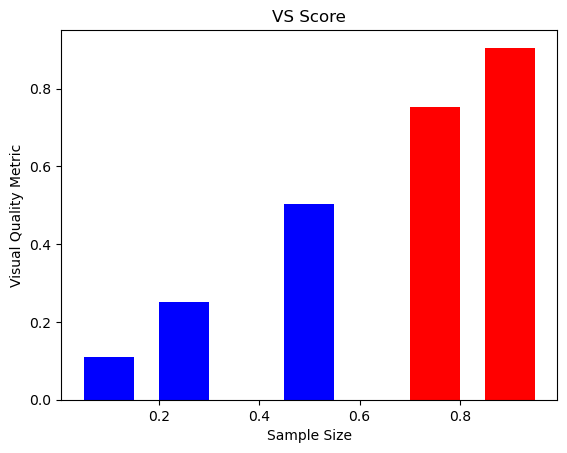

In [66]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit

# load the Boston Housing dataset
df_boston = df_sorted
# assign column names

# Choose a sampling method (random sampling)
target_population_2 = df_sorted[df_sorted['TAX'] > 400]
# Determine the sample size
# Choose a sampling method (e.g., stratified random sampling)
sample_b_1 = target_population_2.sample(n=50, replace=True, random_state=42)
sample_b_2 = target_population_2.sample(n=100, replace=True, random_state=42)
sample_b_3 = target_population_2.sample(n=250, replace=True, random_state=42)
sample_b_4 = target_population_2.sample(n=375, replace=True, random_state=42)
sample_b_5 = target_population_2.sample(n=440, replace=True, random_state=42)
sample_b_1.fillna(0)
sample_b_2.fillna(0)
sample_b_3.fillna(0)
sample_b_4.fillna(0)
sample_b_5.fillna(0)
print('Quality 1:', quality(sample_b_1))
print('Quality 2:', quality(sample_b_2))
print('Quality 3:', quality(sample_b_3))
print('Quality 4:', quality(sample_b_4))
print('Quality 5:', quality(sample_b_5))
qual2=[]
qual2.append(quality(df_b)/quality(sample_b_1))
qual2.append(quality(df_b)/quality(sample_b_2))
qual2.append(quality(df_b)/quality(sample_b_3))
qual2.append(quality(df_b)/quality(sample_b_4))
qual2.append(quality(df_b)/quality(sample_b_5))
print(qual2)
colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qual2[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar(sample_size,qual,width=0.1,color=colors)

# Add labels and title
plt.xlabel("Sample Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

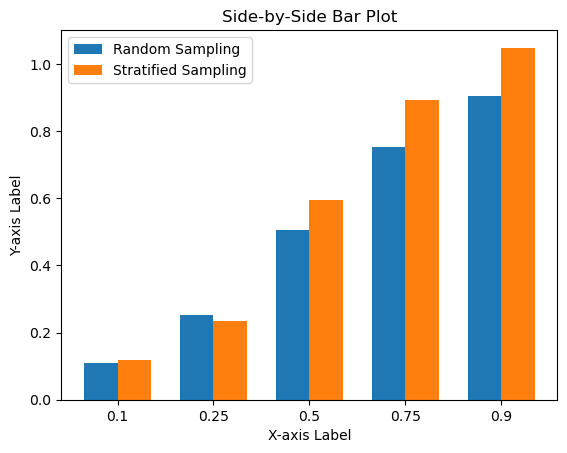

In [67]:
# Set the width of the bars
bar_width = 0.35

# Set the positions of the bars on the X-axis
x_pos1 = np.arange(len(qual))
x_pos2 = [x + bar_width for x in x_pos1]

# Create the plot
fig, ax = plt.subplots()
ax.bar(x_pos1, qual, width=bar_width, label='Random Sampling')
ax.bar(x_pos2, qual2, width=bar_width, label='Stratified Sampling')

# Add labels and titles to the plot
ax.set_xlabel('X-axis Label')
ax.set_ylabel('Y-axis Label')
ax.set_title('Side-by-Side Bar Plot')
ax.set_xticks([x + bar_width / 2 for x in x_pos1])
ax.set_xticklabels([0.1,0.25,0.5,0.75,0.9])

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()


In [68]:
sample_b_1

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
482,5.73116,0.0,18.10,NaN,0.532,7.061,77.0,3.4106,24,666,20.2,395.28,7.01,25.0
412,18.81100,0.0,18.10,0.0,0.597,4.628,100.0,1.5539,24,666,20.2,28.79,34.37,17.9
432,6.44405,0.0,18.10,0.0,0.584,6.425,74.8,2.2004,24,666,20.2,97.95,12.03,16.1
488,0.15086,0.0,27.74,0.0,0.609,5.454,92.7,1.8209,4,711,20.1,395.09,18.06,15.2
478,10.23300,0.0,18.10,0.0,0.614,6.185,96.7,2.1705,24,666,20.2,379.70,18.03,14.6
450,6.71772,0.0,18.10,NaN,0.713,6.749,92.6,2.3236,24,666,20.2,0.32,17.44,13.4
399,9.91655,0.0,18.10,0.0,0.693,5.852,77.8,1.5004,24,666,20.2,338.16,29.97,6.3
492,0.11132,0.0,27.74,0.0,0.609,5.983,83.5,2.1099,4,711,20.1,396.90,13.35,20.1
482,5.73116,0.0,18.10,NaN,0.532,7.061,77.0,3.4106,24,666,20.2,395.28,7.01,25.0
462,6.65492,0.0,18.10,0.0,0.713,6.317,83.0,2.7344,24,666,20.2,396.90,13.99,19.5


In [69]:
import plotly.express as px
import pandas as pd

# load the Boston Housing dataset

# assign column names
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(df_boston, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()


In [70]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_df_1, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [71]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_df_2, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [72]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_df_3, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [73]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_df_4, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [74]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_df_5, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [75]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_b_1, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [76]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_b_2, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [77]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_b_3, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [78]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_b_4, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [79]:
df_boston.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(sample_b_5, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()

In [80]:
step_size = 10

# Generate the sample
samp_df_1 = df_b.iloc[::step_size]


In [81]:
step_size = 8

# Generate the sample
samp_df_2 = df_b.iloc[::step_size]


In [82]:
step_size = 5

# Generate the sample
samp_df_3 = df_b.iloc[::step_size]


In [83]:
step_size = 4

# Generate the sample
samp_df_4 = df_b.iloc[::step_size]


In [84]:
step_size = 2

# Generate the sample
samp_df_5 = df_b.iloc[::step_size]


In [85]:
qual_b=[]
qual_b.append(quality(df_b)/quality(samp_df_1))
qual_b.append(quality(df_b)/quality(samp_df_2))
qual_b.append(quality(df_b)/quality(samp_df_3))
qual_b.append(quality(df_b)/quality(samp_df_4))
qual_b.append(quality(df_b)/quality(samp_df_5))
qual_b

[0.1021339904697773,
 0.12745451520805393,
 0.19840896352071433,
 0.2534688990754052,
 0.4998961819102819]

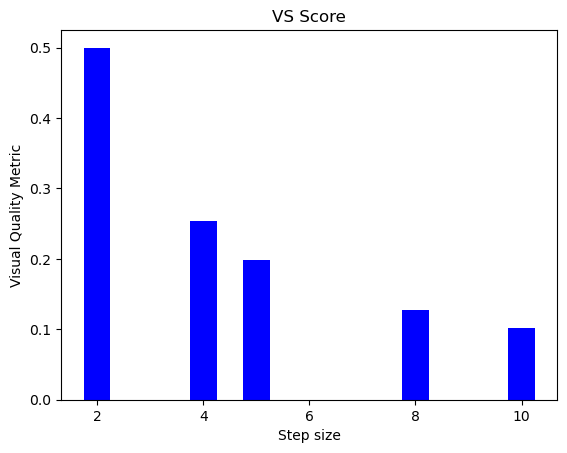

In [88]:
colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qual_b[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar([10,8,5,4,2],qual_b,width=0.5,color=colors)

# Add labels and title
plt.xlabel("Step size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

In [89]:
import plotly.express as px
import pandas as pd

# load the Boston Housing dataset

# assign column names
samp_df_1.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(samp_df_1, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()


In [90]:
import plotly.express as px
import pandas as pd

# load the Boston Housing dataset

# assign column names
samp_df_1.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(samp_df_2, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()


In [91]:
import plotly.express as px
import pandas as pd

# load the Boston Housing dataset

# assign column names
samp_df_1.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(samp_df_3, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()


In [92]:
import plotly.express as px
import pandas as pd

# load the Boston Housing dataset

# assign column names
samp_df_1.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(samp_df_4, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()


In [93]:
import plotly.express as px
import pandas as pd

# load the Boston Housing dataset

# assign column names
samp_df_1.columns = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']

# create a parallel coordinates plot
fig = px.parallel_coordinates(samp_df_5, color='MEDV', labels={'MEDV': 'Median House Value'})
fig.show()


In [94]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
#Function takes a pandas DataFrame as a parameter and returns a float value representing the screen space used by the parallel coordinates visualization of that DataFrame.
def screen_space(df):
    n = len(df.columns)
    d = np.max(df.max()) - np.min(df.min())
    return n * np.log10(d)

def distortion(df):
   #Function takes a pandas DataFrame as a parameter and returns a float value representing the distortion introduced by the parallel coordinates visualization of that DataFrame.
    x_min = np.min(df.min())
    x_max = np.max(df.max())
    y_min = 0
    y_max = 1
    s = (y_max - y_min) / (x_max - x_min)
    p = np.abs(np.diff(df.values, axis=1)).sum()
    return p * s

def quality(df):
 #Function takes a pandas DataFrame as a parameter and returns a float value representing the visual quality of the parallel coordinates visualization of that DataFrame.
    return 1 / (screen_space(df) * distortion(df))

# Example usage:
bc = pd.read_csv("P:/Spring 23/IV/breast-cancer.csv")
bc['diagnosis'] = bc['diagnosis'].replace({'M': 0, 'B': 1})
# # Create a dataframe from the iris data
print('Screen space:', screen_space(bc))
print('Distortion:', distortion(bc))
print('Quality:', quality(bc))
len(bc)


Screen space: 286.70947650294914
Distortion: 18.965189060941793
Quality: 0.00018390806534216453


569

In [95]:
length=len(bc)
df=bc
#creates five samples of the DataFrame 'df' with different sampling sizes.
sample_df_1 = df.sample(n=int(0.1*length), random_state=2)
sample_df_2 = df.sample(n=int(0.25*length), random_state=2)
sample_df_3 = df.sample(n=int(0.5*length), random_state=2)
sample_df_4 = df.sample(n=int(0.75*length), random_state=2)
sample_df_5 = df.sample(n=int(0.9*length), random_state=2)
#Printing visual quality of each sample
print('Quality 1:', quality(sample_df_1))
print('Quality 2:', quality(sample_df_2))
print('Quality 3:', quality(sample_df_3))
print('Quality 4:', quality(sample_df_4))
print('Quality 5:', quality(sample_df_5))

Quality 1: 0.002102907461382972
Quality 2: 0.0008684513593747379
Quality 3: 0.0003387450825005747
Quality 4: 0.00025072569225262483
Quality 5: 0.00021570084887862192


In [96]:
sample_df_1

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
528,918192,1,13.940,13.17,90.31,594.2,0.12480,0.09755,0.101000,0.066150,...,14.620,15.38,94.52,653.3,0.13940,0.13640,0.155900,0.101500,0.2160,0.07253
291,8915,1,14.960,19.10,97.03,687.3,0.08992,0.09823,0.059400,0.048190,...,16.250,26.19,109.10,809.8,0.13130,0.30300,0.180400,0.148900,0.2962,0.08472
467,9113514,1,9.668,18.10,61.06,286.3,0.08311,0.05428,0.014790,0.005769,...,11.150,24.62,71.11,380.2,0.13880,0.12550,0.064090,0.025000,0.3057,0.07875
108,86355,0,22.270,19.67,152.80,1509.0,0.13260,0.27680,0.426400,0.182300,...,28.400,28.01,206.80,2360.0,0.17010,0.69970,0.960800,0.291000,0.4055,0.09789
340,89813,1,14.420,16.54,94.15,641.2,0.09751,0.11390,0.080070,0.042230,...,16.670,21.51,111.40,862.1,0.12940,0.33710,0.375500,0.141400,0.3053,0.08764
256,88649001,0,19.550,28.77,133.60,1207.0,0.09260,0.20630,0.178400,0.114400,...,25.050,36.27,178.60,1926.0,0.12810,0.53290,0.425100,0.194100,0.2818,0.10050
160,8711561,1,11.750,20.18,76.10,419.8,0.10890,0.11410,0.068430,0.037380,...,13.320,26.21,88.91,543.9,0.13580,0.18920,0.195600,0.079090,0.3168,0.07987
306,89344,1,13.200,15.82,84.07,537.3,0.08511,0.05251,0.001461,0.003261,...,14.410,20.45,92.00,636.9,0.11280,0.13460,0.011200,0.025000,0.2651,0.08385
155,8711003,1,12.250,17.94,78.27,460.3,0.08654,0.06679,0.038850,0.023310,...,13.590,25.22,86.60,564.2,0.12170,0.17880,0.194300,0.082110,0.3113,0.08132
511,915664,1,14.810,14.70,94.66,680.7,0.08472,0.05016,0.034160,0.025410,...,15.610,17.58,101.70,760.2,0.11390,0.10110,0.110100,0.079550,0.2334,0.06142


0.08745418841265504
0.21176553339103932
0.5429099191184643
0.7335030713839388
0.8526070541597744


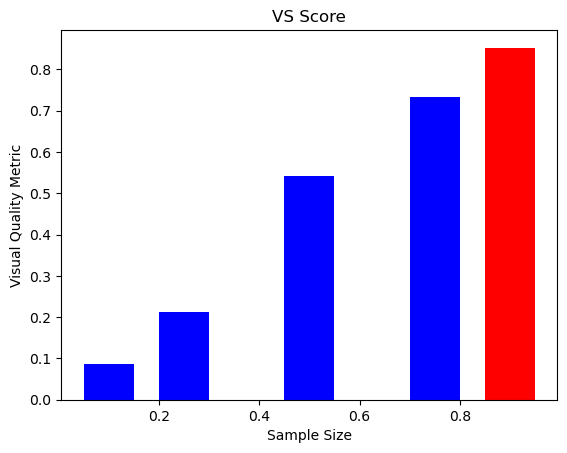

In [97]:
import matplotlib.pyplot as plt
# Create an empty list called 'qual' to store the calculated qualities.
qual3=[]
df=bc
# Create a list for containing the five different sample sizes as decimal values.
sample_size=[0.1,0.25,0.5,0.75,0.9]

# Calculate the quality ratio for each of the five samples by dividing the quality of the original dataset by the quality of each sample.
qual3.append(quality(df)/quality(sample_df_1))
qual3.append(quality(df)/quality(sample_df_2))
qual3.append(quality(df)/quality(sample_df_3))
qual3.append(quality(df)/quality(sample_df_4))
qual3.append(quality(df)/quality(sample_df_5))

# Print the quality ratio for each of the five samples.
print(quality(df)/quality(sample_df_1))
print(quality(df)/quality(sample_df_2))
print(quality(df)/quality(sample_df_3))
print(quality(df)/quality(sample_df_4))
print(quality(df)/quality(sample_df_5))

colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qual3[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar(sample_size,qual3,width=0.1,color=colors)

# Add labels and title
plt.xlabel("Sample Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

In [98]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit

qual3r=[]
# Define the target variable and the stratification variable
target = 'diagnosis'
stratify_by = 'diagnosis'

# Instantiate the StratifiedShuffleSplit object
split = StratifiedShuffleSplit(n_splits=1, test_size=0.9, random_state=42)
columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Perform the stratified sampling
for train_index, test_index in split.split(bc, bc[stratify_by]):
    strat_df_train = bc.loc[train_index]
    strat_df_test = bc.loc[test_index]

# Print the stratified training set
qual3r.append(quality(bc)/quality(strat_df_train))
fig = px.parallel_coordinates(strat_df_train, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [99]:
split = StratifiedShuffleSplit(n_splits=1, test_size=0.75, random_state=42)

# Perform the stratified sampling
for train_index, test_index in split.split(bc, bc[stratify_by]):
    strat_df_train = bc.loc[train_index]
    strat_df_test = bc.loc[test_index]

# Print the stratified training set
qual3r.append(quality(bc)/quality(strat_df_train))
fig = px.parallel_coordinates(strat_df_train, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [100]:
split = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)

# Perform the stratified sampling
for train_index, test_index in split.split(bc, bc[stratify_by]):
    strat_df_train = bc.loc[train_index]
    strat_df_test = bc.loc[test_index]

# Print the stratified training set
qual3r.append(quality(bc)/quality(strat_df_train))
fig = px.parallel_coordinates(strat_df_train, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [101]:
split = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)

# Perform the stratified sampling
for train_index, test_index in split.split(bc, bc[stratify_by]):
    strat_df_train = bc.loc[train_index]
    strat_df_test = bc.loc[test_index]

# Print the stratified training set
qual3r.append(quality(bc)/quality(strat_df_train))
fig = px.parallel_coordinates(strat_df_train, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [102]:
split = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)

# Perform the stratified sampling
for train_index, test_index in split.split(bc, bc[stratify_by]):
    strat_df_train = bc.loc[train_index]
    strat_df_test = bc.loc[test_index]

# Print the stratified training set
qual3r.append(quality(bc)/quality(strat_df_train))
fig = px.parallel_coordinates(strat_df_train, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [103]:
qual3

[0.08745418841265504,
 0.21176553339103932,
 0.5429099191184643,
 0.7335030713839388,
 0.8526070541597744]

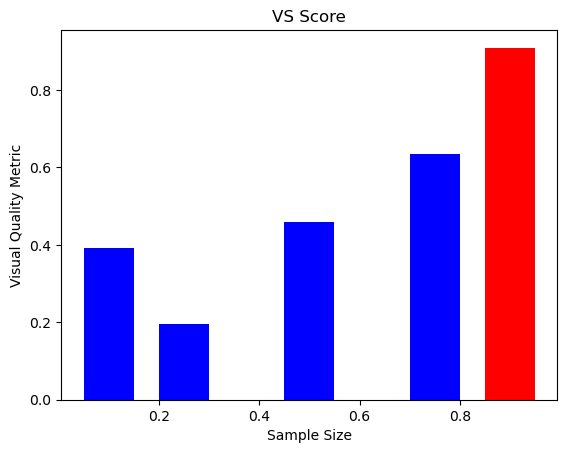

In [104]:
colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qual3[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar(sample_size,qual3r,width=0.1,color=colors)

# Add labels and title
plt.xlabel("Sample Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

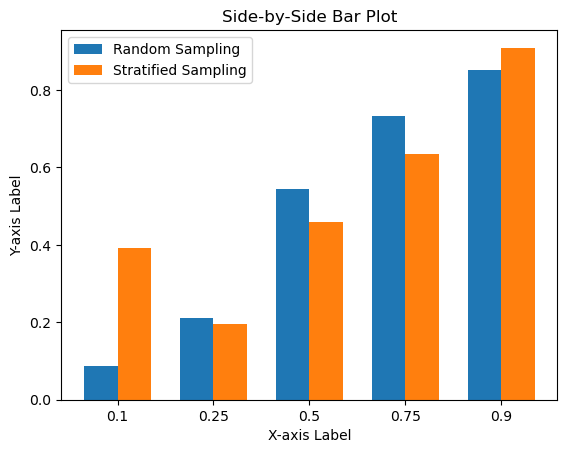

In [105]:
# Set the width of the bars
bar_width = 0.35

# Set the positions of the bars on the X-axis
x_pos1 = np.arange(len(qual))
x_pos2 = [x + bar_width for x in x_pos1]

# Create the plot
fig, ax = plt.subplots()
ax.bar(x_pos1, qual3, width=bar_width, label='Random Sampling')
ax.bar(x_pos2, qual3r, width=bar_width, label='Stratified Sampling')

# Add labels and titles to the plot
ax.set_xlabel('X-axis Label')
ax.set_ylabel('Y-axis Label')
ax.set_title('Side-by-Side Bar Plot')
ax.set_xticks([x + bar_width / 2 for x in x_pos1])
ax.set_xticklabels([0.1,0.25,0.5,0.75,0.9])

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()


In [106]:
bc

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [107]:
import pandas as pd
import plotly.express as px

# Load the breast cancer dataset
# Define the columns to include in the parallel coordinates visualization
columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Create the parallel coordinates visualization
fig = px.parallel_coordinates(bc, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [108]:
sample_df_1

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
528,918192,1,13.940,13.17,90.31,594.2,0.12480,0.09755,0.101000,0.066150,...,14.620,15.38,94.52,653.3,0.13940,0.13640,0.155900,0.101500,0.2160,0.07253
291,8915,1,14.960,19.10,97.03,687.3,0.08992,0.09823,0.059400,0.048190,...,16.250,26.19,109.10,809.8,0.13130,0.30300,0.180400,0.148900,0.2962,0.08472
467,9113514,1,9.668,18.10,61.06,286.3,0.08311,0.05428,0.014790,0.005769,...,11.150,24.62,71.11,380.2,0.13880,0.12550,0.064090,0.025000,0.3057,0.07875
108,86355,0,22.270,19.67,152.80,1509.0,0.13260,0.27680,0.426400,0.182300,...,28.400,28.01,206.80,2360.0,0.17010,0.69970,0.960800,0.291000,0.4055,0.09789
340,89813,1,14.420,16.54,94.15,641.2,0.09751,0.11390,0.080070,0.042230,...,16.670,21.51,111.40,862.1,0.12940,0.33710,0.375500,0.141400,0.3053,0.08764
256,88649001,0,19.550,28.77,133.60,1207.0,0.09260,0.20630,0.178400,0.114400,...,25.050,36.27,178.60,1926.0,0.12810,0.53290,0.425100,0.194100,0.2818,0.10050
160,8711561,1,11.750,20.18,76.10,419.8,0.10890,0.11410,0.068430,0.037380,...,13.320,26.21,88.91,543.9,0.13580,0.18920,0.195600,0.079090,0.3168,0.07987
306,89344,1,13.200,15.82,84.07,537.3,0.08511,0.05251,0.001461,0.003261,...,14.410,20.45,92.00,636.9,0.11280,0.13460,0.011200,0.025000,0.2651,0.08385
155,8711003,1,12.250,17.94,78.27,460.3,0.08654,0.06679,0.038850,0.023310,...,13.590,25.22,86.60,564.2,0.12170,0.17880,0.194300,0.082110,0.3113,0.08132
511,915664,1,14.810,14.70,94.66,680.7,0.08472,0.05016,0.034160,0.025410,...,15.610,17.58,101.70,760.2,0.11390,0.10110,0.110100,0.079550,0.2334,0.06142


In [109]:
fig = px.parallel_coordinates(sample_df_1, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [110]:
fig = px.parallel_coordinates(sample_df_2, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [111]:
fig = px.parallel_coordinates(sample_df_3, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [112]:
fig = px.parallel_coordinates(sample_df_4, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [115]:
fig = px.parallel_coordinates(sample_df_5, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [133]:
qualt=[]

In [134]:
step_size = 10

# Generate the sample
samp_bc_1 = df.iloc[::step_size]
qualt.append(quality(df)/quality(samp_bc_1))

In [135]:
step_size = 8

# Generate the sample
samp_bc_2 = df.iloc[::step_size]
qualt.append(quality(df)/quality(samp_bc_2))

In [136]:
step_size = 5

# Generate the sample
samp_bc_3 = df.iloc[::step_size]
qualt.append(quality(df)/quality(samp_bc_3))

In [137]:
step_size = 4

# Generate the sample
samp_bc_4 = df.iloc[::step_size]
qualt.append(quality(df)/quality(samp_bc_4))

In [138]:
step_size = 2

# Generate the sample
samp_bc_5 = df.iloc[::step_size]
qualt.append(quality(df)/quality(samp_bc_5))

In [139]:
qualt

[0.24327574866280874,
 0.1697969639361505,
 0.2863547804418768,
 0.28390346790084175,
 0.4797928755366744]

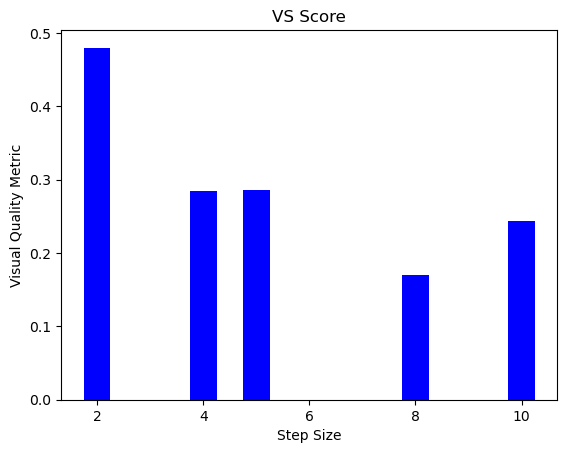

In [140]:
colors=[0]*5

#Iterate through each quality ratio in 'qual' and assign the corresponding color to the corresponding index in 'colors'
for t in range(5):
    if qualt[t]>0.75:
        colors[t]='red'
    else:
        colors[t]='blue'
#Create a bar chart with the sample sizes as the x-axis and the quality ratios as the y-axis
plt.bar([10,8,5,4,2],qualt,width=0.5,color=colors)

# Add labels and title
plt.xlabel("Step Size")
plt.ylabel("Visual Quality Metric")
plt.title("VS Score")

# Display the chart
plt.show()

In [141]:
import pandas as pd
import plotly.express as px

# Load the breast cancer dataset
# Define the columns to include in the parallel coordinates visualization
columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Create the parallel coordinates visualization
fig = px.parallel_coordinates(samp_bc_1, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [142]:
import pandas as pd
import plotly.express as px

# Load the breast cancer dataset
# Define the columns to include in the parallel coordinates visualization
columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Create the parallel coordinates visualization
fig = px.parallel_coordinates(samp_bc_2, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [143]:
import pandas as pd
import plotly.express as px

# Load the breast cancer dataset
# Define the columns to include in the parallel coordinates visualization
columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Create the parallel coordinates visualization
fig = px.parallel_coordinates(samp_bc_3, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [144]:
import pandas as pd
import plotly.express as px

# Load the breast cancer dataset
# Define the columns to include in the parallel coordinates visualization
columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Create the parallel coordinates visualization
fig = px.parallel_coordinates(samp_bc_4, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()


In [145]:
import pandas as pd
import plotly.express as px

# Load the breast cancer dataset
# Define the columns to include in the parallel coordinates visualization
columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Create the parallel coordinates visualization
fig = px.parallel_coordinates(samp_bc_5, color="diagnosis", dimensions=columns)

# Show the visualization
fig.show()
